# 데이터 불러오고 train , test의 라벨링 데이터 붙이기

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import platform
from matplotlib import rc

system = platform.system()
if system == 'Darwin':  
    rc('font', family='AppleGothic') # 한국어 깨짐 방지용


plt.rcParams['axes.unicode_minus'] = False # 마이너스 기호 깨짐 방지용

In [3]:
train_act = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/01.데이터/1.Training/원천데이터/1.걸음걸이/train_activity.csv")
train_act_label = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/01.데이터/1.Training/라벨링데이터/1.걸음걸이/training_label.csv")

train_sleep = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/01.데이터/1.Training/원천데이터/2.수면/train_sleep.csv")
train_sleep_label = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/01.데이터/1.Training/라벨링데이터/2.수면/training_label.csv")

test_act = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/01.데이터/2.Validation/원천데이터/1.걸음걸이/val_activity.csv")
test_act_label = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/01.데이터/2.Validation/라벨링데이터/1.걸음걸이/val_label.csv")

test_sleep = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/01.데이터/2.Validation/원천데이터/2.수면/val_sleep.csv")
test_sleep_label = pd.read_csv("/Users/leehyunsong/Desktop/최종프로젝트/헬스케어/라이프로그/01.데이터/2.Validation/라벨링데이터/2.수면/val_label.csv")

In [4]:
train_act

,EMAIL,activity_average_met,activity_cal_active,activity_cal_total,activity_class_5min,activity_daily_movement,activity_day_end,activity_day_start,activity_high,activity_inactive,...,activity_score_meet_daily_targets,activity_score_move_every_hour,activity_score_recovery_time,activity_score_stay_active,activity_score_training_frequency,activity_score_training_volume,activity_steps,activity_total,CONVERT(activity_class_5min USING utf8),CONVERT(activity_met_1min USING utf8)
0,nia+279@rowan.kr,1.28125,196,2251,...,3353,2020-10-20T03:59:59+09:00,2020-10-19T04:00:00+09:00,0,714,...,78,100,100,54,100,97,4212,207,1/1/2/2/2/2/1/1/1/1/1/1/1/2/2/2/2/2/2/3/3/2/2/...,1.2/0.9/1/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/...
1,nia+279@rowan.kr,1.25000,145,2159,...,2516,2020-10-21T03:59:59+09:00,2020-10-20T04:00:00+09:00,0,719,...,60,100,100,58,96,96,3306,140,1/1/1/2/2/2/2/2/2/2/2/2/1/1/1/1/1/2/3/3/3/3/2/...,0.9/0.9/1.3/1/0.9/0.9/1.1/0.9/1/0.9/1/0.9/1/0....
2,nia+279@rowan.kr,1.21875,118,2140,...,1716,2020-10-22T03:59:59+09:00,2020-10-21T04:00:00+09:00,0,708,...,43,95,100,55,71,83,2550,131,1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/2/3/3/3/...,0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....
3,nia+279@rowan.kr,1.28125,180,2240,...,2791,2020-10-23T03:59:59+09:00,2020-10-22T04:00:00+09:00,0,705,...,43,100,100,58,71,59,4009,208,1/1/1/1/1/1/1/1/1/1/2/2/2/2/3/3/3/2/3/3/3/3/3/...,0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....
4,nia+279@rowan.kr,1.46875,374,2559,...,5393,2020-10-24T03:59:59+09:00,2020-10-23T04:00:00+09:00,0,437,...,43,100,100,89,40,46,8081,517,1/1/1/2/2/2/2/2/2/1/1/1/3/2/2/1/2/2/2/3/3/2/2/...,0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9700,nia+206@rowan.kr,1.34375,249,2351,...,4411,2020-12-25T03:59:59+09:00,2020-12-24T04:00:00+09:00,1,780,...,25,43,100,45,40,95,4972,190,1/1/1/1/1/1/1/1/1/1/2/3/2/2/2/1/1/1/1/1/1/1/1/...,0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....
9701,nia+206@rowan.kr,1.53125,570,2682,...,11057,2020-12-27T03:59:59+09:00,2020-12-26T04:00:00+09:00,1,518,...,43,95,100,76,71,93,11878,394,1/1/1/1/1/1/2/2/2/2/2/2/1/1/1/1/1/1/1/1/1/1/1/...,0.9/0.9/0.9/0.9/1.1/0.9/0.9/1.1/0.9/0.9/0.9/0....
9702,nia+206@rowan.kr,1.34375,295,2331,...,5135,2020-12-28T03:59:59+09:00,2020-12-27T04:00:00+09:00,4,578,...,25,100,100,70,40,95,5752,207,1/1/1/2/3/2/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/1/...,1.1/0.9/0.9/0.9/1/0.9/0.9/0.9/0.9/0.9/0.9/0.9/...
9703,nia+206@rowan.kr,1.31250,186,2280,...,3178,2020-12-29T03:59:59+09:00,2020-12-28T04:00:00+09:00,0,778,...,25,95,100,47,40,93,3852,156,1/1/1/1/1/1/1/1/1/1/1/1/2/2/0/0/0/0/0/0/0/0/0/...,0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0.9/0....


In [5]:
train_act_label

,SAMPLE_EMAIL,DIAG_NM
0,nia+315@rowan.kr,CN
1,nia+014@rowan.kr,MCI
2,nia+220@rowan.kr,CN
3,nia+096@rowan.kr,MCI
4,nia+396@rowan.kr,CN
...,...,...
136,nia+181@rowan.kr,CN
137,nia+354@rowan.kr,CN
138,nia+448@rowan.kr,MCI
139,nia+394@rowan.kr,CN


In [6]:
print(train_act.shape)
print(train_act_label.shape)
print(train_sleep.shape)
print(train_sleep_label.shape)

(9705, 31)
(141, 2)
(9705, 36)
(141, 2)


In [7]:
print(test_act.shape)
print(test_act_label.shape)
print(test_sleep.shape)
print(test_sleep_label.shape)

(2478, 31)
(33, 2)
(2478, 36)
(33, 2)


In [8]:
# 컬럼이름 확인해보기
life_log_dict = {
    'train_act': train_act,
    'train_act_label': train_act_label,
    'train_sleep': train_sleep,
    'train_sleep_l': train_sleep_label,
    'test_act': test_act,
    'test_act_label': test_act_label,
    'test_sleep': test_sleep,
    'test_sleep_label': test_sleep_label
}


for name, df in life_log_dict.items():
    print(f'{name} : {df.columns.tolist()}')

train_act : ['EMAIL', 'activity_average_met', 'activity_cal_active', 'activity_cal_total', 'activity_class_5min', 'activity_daily_movement', 'activity_day_end', 'activity_day_start', 'activity_high', 'activity_inactive', 'activity_inactivity_alerts', 'activity_low', 'activity_medium', 'activity_met_1min', 'activity_met_min_high', 'activity_met_min_inactive', 'activity_met_min_low', 'activity_met_min_medium', 'activity_non_wear', 'activity_rest', 'activity_score', 'activity_score_meet_daily_targets', 'activity_score_move_every_hour', 'activity_score_recovery_time', 'activity_score_stay_active', 'activity_score_training_frequency', 'activity_score_training_volume', 'activity_steps', 'activity_total', 'CONVERT(activity_class_5min USING utf8)', 'CONVERT(activity_met_1min USING utf8)']
train_act_label : ['SAMPLE_EMAIL', 'DIAG_NM']
train_sleep : ['EMAIL', 'sleep_awake', 'sleep_bedtime_end', 'sleep_bedtime_start', 'sleep_breath_average', 'sleep_deep', 'sleep_duration', 'sleep_efficiency', 'sl

-> EMAIL의 컬럼명이 EMAIL, SAMPLE_EMAIL로 다름

In [9]:
# SAMPLE_EMAIL을 EMAIL로 바꿔주기
for name, df in life_log_dict.items():
    df.columns = ['EMAIL'] + list(df.columns[1:])

-> EMAIL(PK)기준으로 라벨링 + 원천 데이터 병합

In [10]:
train_act = pd.merge(train_act, train_act_label, on='EMAIL', how='left')
train_sleep = pd.merge(train_sleep, train_sleep_label, on='EMAIL', how='left')
test_act = pd.merge(test_act, test_act_label, on='EMAIL', how='left')
test_sleep = pd.merge(test_sleep, test_sleep_label, on='EMAIL', how='left')

In [11]:
print(train_act.shape)
print(train_sleep.shape)
print(test_act.shape)
print(test_sleep.shape)

(9705, 32)
(9705, 37)
(2478, 32)
(2478, 37)


----

# act 기반 feature importance 

- train, test 데이터 전처리 후 한국어 컬럼 변명, 일반인 0, 치매 1 라벨링

In [12]:
train_act['activity_day_start'] = pd.to_datetime(train_act['activity_day_start'])
train_act['activity_day_start'] = train_act['activity_day_start'].dt.strftime('%Y-%m-%d %H:%M:%S')
train_act['activity_day_end'] = pd.to_datetime(train_act['activity_day_end'])
train_act['activity_day_end'] = train_act['activity_day_end'].dt.strftime('%Y-%m-%d %H:%M:%S')

In [13]:
test_act['activity_day_start'] = pd.to_datetime(test_act['activity_day_start'])
test_act['activity_day_start'] = test_act['activity_day_start'].dt.strftime('%Y-%m-%d %H:%M:%S')
test_act['activity_day_end'] = pd.to_datetime(test_act['activity_day_end'])
test_act['activity_day_end'] = test_act['activity_day_end'].dt.strftime('%Y-%m-%d %H:%M:%S')

In [14]:
train_act.drop(columns=['CONVERT(activity_met_1min USING utf8)', 'CONVERT(activity_class_5min USING utf8)', 'activity_class_5min', 'activity_met_1min'], inplace = True)
test_act.drop(columns=['CONVERT(activity_met_1min USING utf8)', 'CONVERT(activity_class_5min USING utf8)', 'activity_class_5min', 'activity_met_1min'], inplace = True)
test_act

,EMAIL,activity_average_met,activity_cal_active,activity_cal_total,activity_daily_movement,activity_day_end,activity_day_start,activity_high,activity_inactive,activity_inactivity_alerts,...,activity_score,activity_score_meet_daily_targets,activity_score_move_every_hour,activity_score_recovery_time,activity_score_stay_active,activity_score_training_frequency,activity_score_training_volume,activity_steps,activity_total,DIAG_NM
0,nia+404@rowan.kr,1.71875,730,2944,14346,2020-11-28 03:59:59,2020-11-27 04:00:00,0,417,0,...,96,95,100,100,86,100,98,15867,592,CN
1,nia+404@rowan.kr,1.40625,342,2449,6352,2020-11-29 03:59:59,2020-11-28 04:00:00,0,473,0,...,91,78,100,100,83,100,97,7755,400,CN
2,nia+404@rowan.kr,1.46875,401,2544,7297,2020-11-30 03:59:59,2020-11-29 04:00:00,0,586,0,...,93,95,100,100,71,96,96,8341,386,CN
3,nia+404@rowan.kr,0.34375,27,1850,491,2020-12-01 03:59:59,2020-11-30 04:00:00,0,176,0,...,93,95,100,100,74,96,92,8122,35,CN
4,nia+404@rowan.kr,1.46875,333,2518,5861,2020-12-02 03:59:59,2020-12-01 04:00:00,0,646,0,...,88,95,100,100,65,71,80,7378,383,CN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2473,nia+280@rowan.kr,1.59375,648,2760,12256,2021-02-13 03:59:59,2021-02-12 04:00:00,0,444,0,...,97,100,100,95,88,100,100,14654,447,CN
2474,nia+280@rowan.kr,1.43750,379,2507,6973,2021-02-14 03:59:59,2021-02-13 04:00:00,0,623,0,...,91,100,100,89,65,100,99,8425,374,CN
2475,nia+280@rowan.kr,1.56250,670,2747,13008,2021-02-16 03:59:59,2021-02-15 04:00:00,0,422,0,...,99,100,100,100,95,100,99,15341,442,CN
2476,nia+280@rowan.kr,1.46875,556,2570,11043,2021-02-17 03:59:59,2021-02-16 04:00:00,0,452,2,...,95,100,78,95,87,100,100,12006,312,CN


In [15]:
dict = {
    'EMAIL': '이메일',
    'activity_average_met': '하루 평균 운동 강도',
    'activity_cal_active': '하루간 활동 칼로리',
    'activity_cal_total': '하루간 총 사용 칼로리',
    'activity_daily_movement': '하루동안 움직인 거리',
    'activity_day_end': '활동 종료 시간',
    'activity_day_start': '활동 시작 시간',
    'activity_high': '고강도 활동 시간',
    'activity_inactive': '비활동 시간',
    'activity_inactivity_alerts': '비활동 알람 횟수',
    'activity_low': '저강도 활동 시간',
    'activity_medium': '중강도 활동 시간',
    'activity_met_min_high': '하루간 고강도 운동 강도',
    'activity_met_min_inactive': '하루간 비활동 운동 강도',
    'activity_met_min_low': '하루간 저강도 활동 운동 강도',
    'activity_met_min_medium': '하루간 중강도 활동 운동 강도',
    'activity_non_wear': '미착용 시간',
    'activity_rest': '휴식 시간',
    'activity_score': '활동 점수',
    'activity_score_meet_daily_targets': '활동 목표달성 점수',
    'activity_score_move_every_hour': '매 시간 당 활동유지 점수',
    'activity_score_recovery_time': '회복시간 점수',
    'activity_score_stay_active': '활동 유지 점수',
    'activity_score_training_frequency': '운동 빈도 점수',
    'activity_score_training_volume': '운동량 점수',
    'activity_steps': '매일 걸음 수',
    'activity_total': '활동 총 시간',
    'DIAG_NM' : '진단'
}

train_act = train_act.rename(columns = dict)
test_act = test_act.rename(columns = dict)

In [16]:
# 0이 일반인, 1이 치매
train_act['진단'] = train_act['진단'].apply(lambda x: 0 if x == 'CN' else 1)

## train, test 쪼개기

In [18]:
train_act

,이메일,하루 평균 운동 강도,하루간 활동 칼로리,하루간 총 사용 칼로리,하루동안 움직인 거리,활동 종료 시간,활동 시작 시간,고강도 활동 시간,비활동 시간,비활동 알람 횟수,...,활동 점수,활동 목표달성 점수,매 시간 당 활동유지 점수,회복시간 점수,활동 유지 점수,운동 빈도 점수,운동량 점수,매일 걸음 수,활동 총 시간,진단
0,nia+279@rowan.kr,1.28125,196,2251,3353,2020-10-20 03:59:59,2020-10-19 04:00:00,0,714,0,...,87,78,100,100,54,100,97,4212,207,1
1,nia+279@rowan.kr,1.25000,145,2159,2516,2020-10-21 03:59:59,2020-10-20 04:00:00,0,719,0,...,83,60,100,100,58,96,96,3306,140,1
2,nia+279@rowan.kr,1.21875,118,2140,1716,2020-10-22 03:59:59,2020-10-21 04:00:00,0,708,1,...,73,43,95,100,55,71,83,2550,131,1
3,nia+279@rowan.kr,1.28125,180,2240,2791,2020-10-23 03:59:59,2020-10-22 04:00:00,0,705,0,...,70,43,100,100,58,71,59,4009,208,1
4,nia+279@rowan.kr,1.46875,374,2559,5393,2020-10-24 03:59:59,2020-10-23 04:00:00,0,437,0,...,70,43,100,100,89,40,46,8081,517,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9700,nia+206@rowan.kr,1.34375,249,2351,4411,2020-12-25 03:59:59,2020-12-24 04:00:00,1,780,4,...,61,25,43,100,45,40,95,4972,190,0
9701,nia+206@rowan.kr,1.53125,570,2682,11057,2020-12-27 03:59:59,2020-12-26 04:00:00,1,518,1,...,78,43,95,100,76,71,93,11878,394,0
9702,nia+206@rowan.kr,1.34375,295,2331,5135,2020-12-28 03:59:59,2020-12-27 04:00:00,4,578,0,...,70,25,100,100,70,40,95,5752,207,0
9703,nia+206@rowan.kr,1.31250,186,2280,3178,2020-12-29 03:59:59,2020-12-28 04:00:00,0,778,1,...,66,25,95,100,47,40,93,3852,156,0


In [19]:
X_train = train_act.drop(columns=['진단', '이메일', '활동 시작 시간', '활동 종료 시간'])
Y_train = train_act['진단']

X_test = test_act.drop(columns=['진단', '이메일', '활동 시작 시간', '활동 종료 시간'])
Y_test = test_act['진단']

In [20]:
print(len(train_act[train_act['진단'] == 0]))
print(len(train_act[train_act['진단'] == 1]))

print(len(test_act[test_act['진단'] == 0]))
print(len(test_act[test_act['진단'] == 1]))

5781
3924
1956
522


-> 불균형 너무 심함

In [21]:
from imblearn.over_sampling import SMOTE

print("전:", X_train.shape, Y_train.value_counts().to_dict())

smote = SMOTE(random_state=42)
X_train, Y_train = smote.fit_resample(X_train, Y_train)

print("후:", X_train.shape, pd.Series(Y_train).value_counts().to_dict())


전: (9705, 24) {0: 5781, 1: 3924}
후: (11562, 24) {1: 5781, 0: 5781}


In [22]:
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)

(11562, 24)
(11562,)
(2478, 24)
(2478,)


## 모델

### randomforest

In [102]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

model = RandomForestClassifier(random_state=42)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(Y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

print(classification_report(Y_test, y_pred))


Test Accuracy: 0.6005
              precision    recall  f1-score   support

           0       0.78      0.69      0.73      1956
           1       0.19      0.28      0.23       522

    accuracy                           0.60      2478
   macro avg       0.49      0.48      0.48      2478
weighted avg       0.66      0.60      0.62      2478



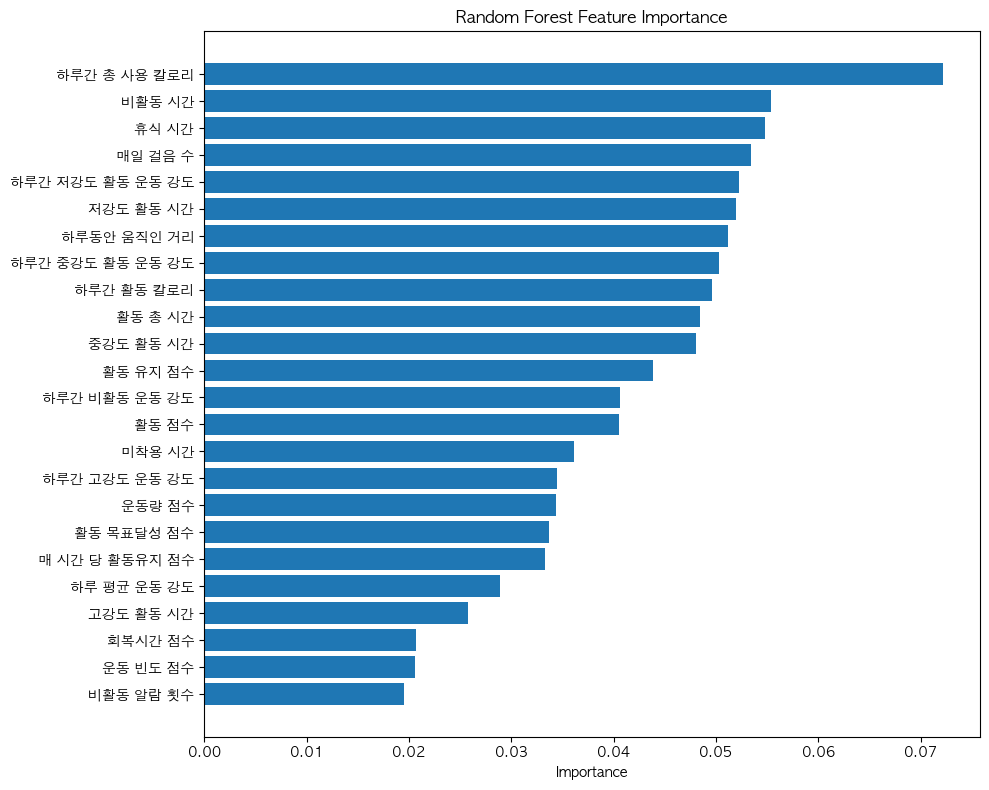

In [103]:
feature_importances = model.feature_importances_
feature_names = X_train.columns


importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

importance_df.sort_values(by='Importance', ascending = True,  inplace=True)

# 시각화
plt.figure(figsize=(10, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel("Importance")
plt.title("Random Forest Feature Importance")
plt.tight_layout()
plt.show()

In [104]:
top_5_features = importance_df['Feature'].tail(5).tolist()

X_train_top5 = X_train[top_5_features]
X_test_top5 = X_test[top_5_features]

model_top5 = RandomForestClassifier(random_state=42)
model_top5.fit(X_train_top5, Y_train)

# 예측 및 평가
y_pred_top5 = model_top5.predict(X_test_top5)
accuracy = accuracy_score(Y_test, y_pred_top5)
print(f"Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred_top5))

Test Accuracy: 0.5650
              precision    recall  f1-score   support

           0       0.79      0.62      0.69      1956
           1       0.21      0.38      0.27       522

    accuracy                           0.56      2478
   macro avg       0.50      0.50      0.48      2478
weighted avg       0.66      0.56      0.60      2478



In [105]:
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score
from sklearn.model_selection import cross_val_score, StratifiedKFold

def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 500),
        "max_depth": trial.suggest_int("max_depth", 3, 30),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None]),
        "class_weight": trial.suggest_categorical("class_weight", ["balanced", "balanced_subsample", None]),
    }
    
    model = RandomForestClassifier(random_state=42, **params)

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    # 클래스 1 (양성 클래스) recall만 평가
    scores = cross_val_score(
        model, X_train_top5, Y_train,
        scoring='recall', cv=cv
    )
    return scores.mean()

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)


[I 2025-06-19 23:15:35,617] A new study created in memory with name: no-name-2a234376-0f7b-4080-9eef-64b5e6b00ed4
[I 2025-06-19 23:16:26,598] Trial 0 finished with value: 0.6677092648030792 and parameters: {'n_estimators': 467, 'max_depth': 24, 'min_samples_split': 9, 'min_samples_leaf': 4, 'max_features': 'log2', 'class_weight': 'balanced_subsample'}. Best is trial 0 with value: 0.6677092648030792.
[I 2025-06-19 23:17:05,477] Trial 1 finished with value: 0.6457399371360726 and parameters: {'n_estimators': 425, 'max_depth': 27, 'min_samples_split': 2, 'min_samples_leaf': 18, 'max_features': 'sqrt', 'class_weight': 'balanced_subsample'}. Best is trial 0 with value: 0.6677092648030792.
[I 2025-06-19 23:17:28,146] Trial 2 finished with value: 0.6677076199334275 and parameters: {'n_estimators': 95, 'max_depth': 30, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': None, 'class_weight': 'balanced'}. Best is trial 0 with value: 0.6677092648030792.
[I 2025-06-19 23:17:59,470] Tri

In [106]:
best_params = study.best_params
model = RandomForestClassifier(random_state=42, **best_params)
model.fit(X_train_top5, Y_train)

y_pred = model.predict(X_test_top5)
print("Best params:", best_params)
print("Accuracy:", accuracy_score(Y_test, y_pred))
print(classification_report(Y_test, y_pred))

Best params: {'n_estimators': 255, 'max_depth': 28, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'class_weight': 'balanced_subsample'}
Accuracy: 0.5524616626311541
              precision    recall  f1-score   support

           0       0.78      0.61      0.68      1956
           1       0.19      0.35      0.25       522

    accuracy                           0.55      2478
   macro avg       0.49      0.48      0.47      2478
weighted avg       0.66      0.55      0.59      2478



----

### GBM

In [65]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report

model = GradientBoostingClassifier(random_state=42)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(Y_test, y_pred)
print(f"Gradient Boosting Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred))


Gradient Boosting Test Accuracy: 0.5613
              precision    recall  f1-score   support

           0       0.77      0.63      0.70      1956
           1       0.17      0.29      0.22       522

    accuracy                           0.56      2478
   macro avg       0.47      0.46      0.46      2478
weighted avg       0.64      0.56      0.59      2478



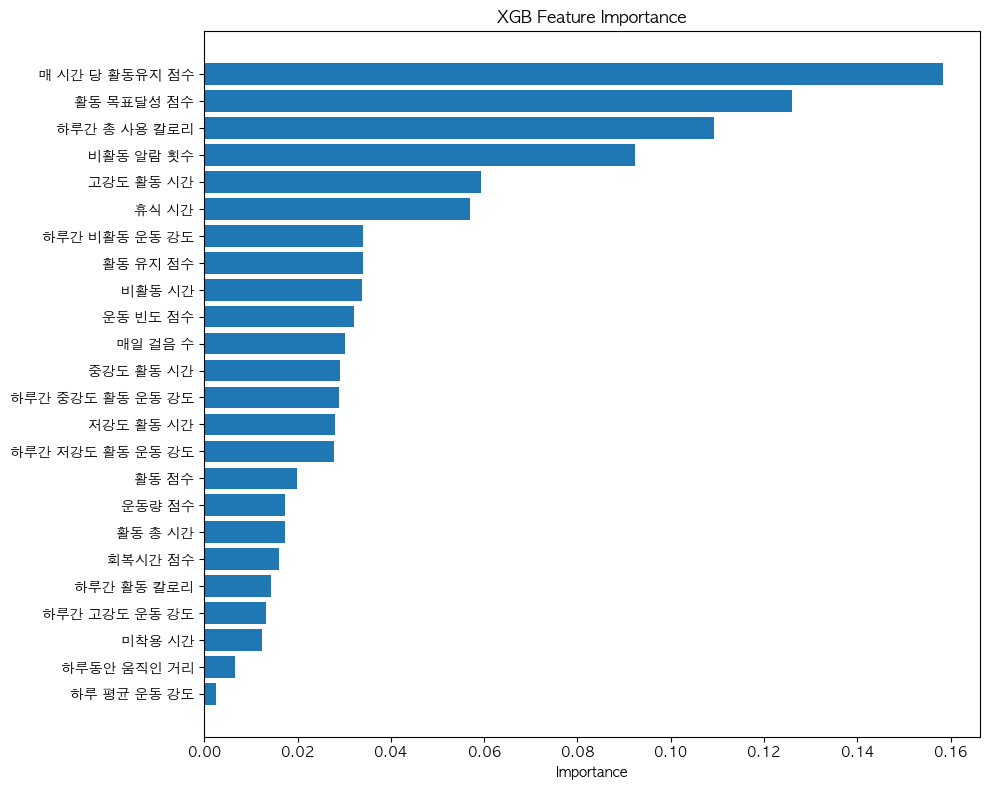

In [66]:
feature_importances = model.feature_importances_
feature_names = X_train.columns

# Pandas로 정렬 (선택 사항)
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=True)

# 시각화
plt.figure(figsize=(10, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel("Importance")
plt.title("XGB Feature Importance")
plt.tight_layout()
plt.show()

In [ ]:
top_5_features = importance_df['Feature'].tail(5).tolist()

X_train_top5 = X_train[top_5_features]
X_test_top5 = X_test[top_5_features]

model_top5 =GradientBoostingClassifier(random_state=42)
model_top5.fit(X_train_top5, Y_train)

# 예측 및 평가
y_pred_top5 = model_top5.predict(X_test_top5)
accuracy = accuracy_score(Y_test, y_pred_top5)
print(f"Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred_top5))


Test Accuracy: 0.5395
              precision    recall  f1-score   support

           0       0.77      0.59      0.67      1956
           1       0.18      0.35      0.24       522

    accuracy                           0.54      2478
   macro avg       0.48      0.47      0.46      2478
weighted avg       0.65      0.54      0.58      2478



In [ ]:
import optuna
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 10),  # 클래스 불균형 대응
        'eval_metric': 'logloss'
    }

    model = XGBClassifier(random_state=42, **params)

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(
        model, X_train_top5, Y_train,
        scoring='recall',  
        cv=cv
    ).mean()

    return score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)


[I 2025-06-19 19:54:55,495] A new study created in memory with name: no-name-d1681a7d-11ba-49cb-b9de-3b672dd9c439
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [19:54:55] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [19:54:55] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [19:54:56] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: Us

In [74]:
best_params = study.best_params

model = XGBClassifier(random_state=42, **best_params)
model.fit(X_train_top5, Y_train)

y_pred = model.predict(X_test_top5)

from sklearn.metrics import classification_report, accuracy_score
print("Best params:", best_params)
print("Test Accuracy:", accuracy_score(Y_test, y_pred))
print(classification_report(Y_test, y_pred))

Best params: {'n_estimators': 993, 'max_depth': 3, 'learning_rate': 0.011648284317392073, 'subsample': 0.9978487431982668, 'colsample_bytree': 0.9882500786000418, 'gamma': 3.2833061147584126, 'reg_alpha': 4.9927561145730035, 'reg_lambda': 2.938729598234412, 'scale_pos_weight': 7.7475043010442315}
Test Accuracy: 0.211864406779661
              precision    recall  f1-score   support

           0       0.56      0.01      0.01      1956
           1       0.21      0.98      0.34       522

    accuracy                           0.21      2478
   macro avg       0.38      0.49      0.18      2478
weighted avg       0.49      0.21      0.08      2478



---

### Adaboost

In [77]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, classification_report

model = AdaBoostClassifier(random_state=42)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(Y_test, y_pred)
print(f"AdaBoost Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred))


AdaBoost Test Accuracy: 0.4980
              precision    recall  f1-score   support

           0       0.76      0.53      0.62      1956
           1       0.18      0.38      0.24       522

    accuracy                           0.50      2478
   macro avg       0.47      0.46      0.43      2478
weighted avg       0.64      0.50      0.54      2478



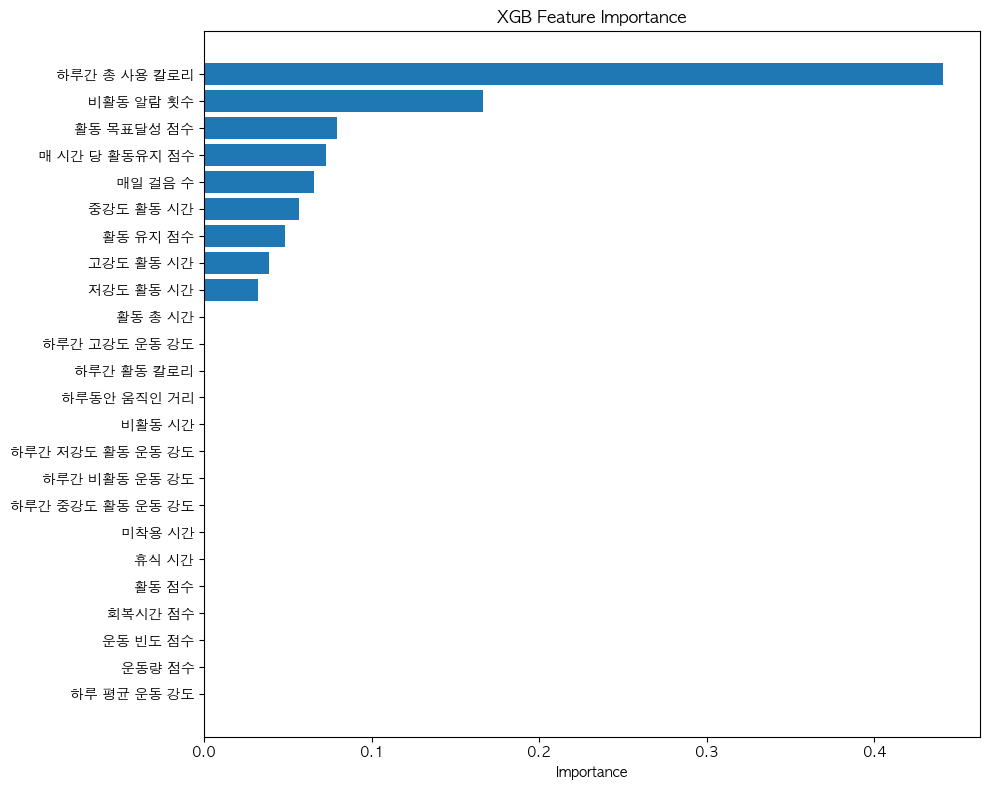

In [78]:
feature_importances = model.feature_importances_
feature_names = X_train.columns

# Pandas로 정렬 (선택 사항)
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=True)

# 시각화
plt.figure(figsize=(10, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel("Importance")
plt.title("XGB Feature Importance")
plt.tight_layout()
plt.show()

In [80]:
top_9_features = importance_df['Feature'].tail(9).tolist()

X_train_top9 = X_train[top_9_features]
X_test_top9 = X_test[top_9_features]

model_top9 = AdaBoostClassifier(random_state=42)
model_top9.fit(X_train_top9, Y_train)

# 예측 및 평가
y_pred_top9 = model_top9.predict(X_test_top9)
accuracy = accuracy_score(Y_test, y_pred_top9)
print(f"Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred_top9))

Test Accuracy: 0.4980
              precision    recall  f1-score   support

           0       0.76      0.53      0.62      1956
           1       0.18      0.38      0.24       522

    accuracy                           0.50      2478
   macro avg       0.47      0.46      0.43      2478
weighted avg       0.64      0.50      0.54      2478



In [83]:
import optuna
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold

def objective(trial):
    estimator = DecisionTreeClassifier(
        max_depth=trial.suggest_int("max_depth", 1, 10),
        min_samples_split=trial.suggest_int("min_samples_split", 2, 20),
        min_samples_leaf=trial.suggest_int("min_samples_leaf", 1, 20)
    )

    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
        'estimator': estimator,
    }

    model = AdaBoostClassifier(random_state=42, **params)

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(
        model, X_train_top9, Y_train,
        scoring='recall',  # 🎯 재현율 기준 최적화
        cv=cv
    ).mean()

    return score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)


[I 2025-06-19 20:03:39,104] A new study created in memory with name: no-name-b0c076f2-1fcf-4dcb-a084-e61e7b66b2b8
[I 2025-06-19 20:03:43,214] Trial 0 finished with value: 0.7142399356407365 and parameters: {'max_depth': 1, 'min_samples_split': 2, 'min_samples_leaf': 5, 'n_estimators': 121, 'learning_rate': 0.3641619531199468}. Best is trial 0 with value: 0.7142399356407365.
[I 2025-06-19 20:05:12,884] Trial 1 finished with value: 0.6915782673840292 and parameters: {'max_depth': 9, 'min_samples_split': 11, 'min_samples_leaf': 4, 'n_estimators': 420, 'learning_rate': 0.42197447972712504}. Best is trial 0 with value: 0.7142399356407365.
[I 2025-06-19 20:05:43,547] Trial 2 finished with value: 0.700574657642812 and parameters: {'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 4, 'n_estimators': 132, 'learning_rate': 0.15121757043459744}. Best is trial 0 with value: 0.7142399356407365.
[I 2025-06-19 20:06:49,807] Trial 3 finished with value: 0.6882915187530094 and parameters: {

In [84]:
best_params = study.best_params

# estimator 관련 파라미터 분리
estimator = DecisionTreeClassifier(
    max_depth=best_params.pop('max_depth'),
    min_samples_split=best_params.pop('min_samples_split'),
    min_samples_leaf=best_params.pop('min_samples_leaf')
)

model = AdaBoostClassifier(random_state=42, estimator=estimator, **best_params)
model.fit(X_train_top9, Y_train)

y_pred = model.predict(X_test_top9)
print("Test Accuracy:", accuracy_score(Y_test, y_pred))
print(classification_report(Y_test, y_pred))

Test Accuracy: 0.3898305084745763
              precision    recall  f1-score   support

           0       0.72      0.38      0.49      1956
           1       0.16      0.44      0.23       522

    accuracy                           0.39      2478
   macro avg       0.44      0.41      0.36      2478
weighted avg       0.60      0.39      0.44      2478



----

### lightgbm

In [85]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, classification_report

model = lgb.LGBMClassifier(random_state=42)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(Y_test, y_pred)
print(f"LightGBM Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred))


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 5781, number of negative: 5781
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4114
[LightGBM] [Info] Number of data points in the train set: 11562, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
LightGBM Test Accuracy: 0.6251
              precision    recall  f1-score   support

           0       0.79      0.72      0.75      1956
           1       0.20      0.27      0.23       522

    accuracy                           0.63      2478
   macro avg       0.50      0.49      0.49      2478
weighted avg       0.66      0.63      0.64      2478



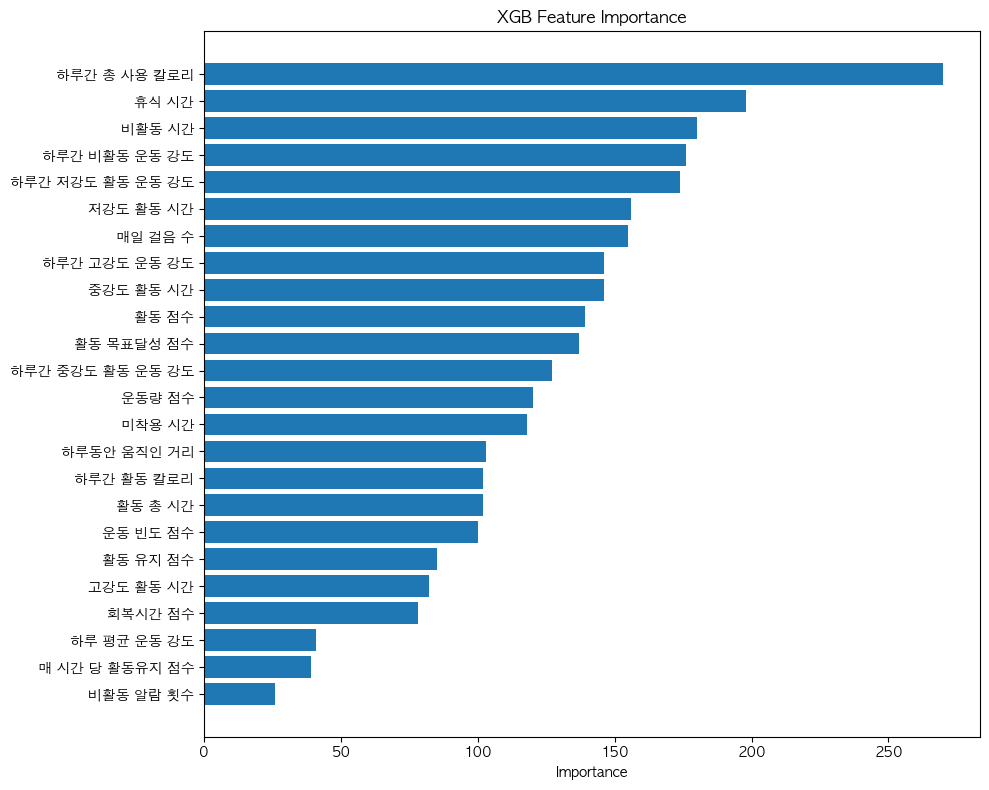

In [86]:
feature_importances = model.feature_importances_
feature_names = X_train.columns

# Pandas로 정렬 (선택 사항)
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=True)

# 시각화
plt.figure(figsize=(10, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel("Importance")
plt.title("XGB Feature Importance")
plt.tight_layout()
plt.show()

In [90]:
top_5_features = importance_df['Feature'].tail(5).tolist()

X_train_top5 = X_train[top_5_features]
X_test_top5 = X_test[top_5_features]

model_top5 =lgb.LGBMClassifier(random_state=42)
model_top5.fit(X_train_top5, Y_train)

# 예측 및 평가
y_pred_top5 = model_top5.predict(X_test_top5)
accuracy = accuracy_score(Y_test, y_pred_top5)
print(f"Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred_top5))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 5781, number of negative: 5781
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 11562, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Test Accuracy: 0.5375
              precision    recall  f1-score   support

           0       0.79      0.57      0.66      1956
           1       0.21      0.42      0.27       522

    accuracy                           0.54      2478
   macro avg       0.50      0.49      0.47      2478
weighted avg       0.66      0.54      0.58      2478



In [ ]:
import optuna
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import recall_score

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'num_leaves': trial.suggest_int('num_leaves', 7, 255),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
        'class_weight': 'balanced',
    }

    model = lgb.LGBMClassifier(random_state=42, **params)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    recalls = []

    for train_idx, val_idx in cv.split(X_train_top5, Y_train):
        X_tr, X_val = X_train_top5.iloc[train_idx], X_train_top5.iloc[val_idx]
        y_tr, y_val = Y_train.iloc[train_idx], Y_train.iloc[val_idx]

        model.fit(X_tr, y_tr)
        y_pred = model.predict(X_val)

        recall_1 = recall_score(y_val, y_pred, pos_label=1)  # label=1 recall
        recalls.append(recall_1)

    return sum(recalls) / len(recalls)

# Optuna 수행
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)


[I 2025-06-19 22:03:00,506] A new study created in memory with name: no-name-610a5871-ef14-4f48-b0b5-2276157ca3b9


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:03:07,685] Trial 0 finished with value: 0.6414089953435236 and parameters: {'n_estimators': 596, 'learning_rate': 0.26270831669568045, 'max_depth': 6, 'num_leaves': 239, 'min_child_samples': 42, 'subsample': 0.8967599272686831, 'colsample_bytree': 0.7800028605247086, 'reg_alpha': 3.232385313043951, 'reg_lambda': 2.0902717304921445}. Best is trial 0 with value: 0.6414089953435236.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:03:27,465] Trial 1 finished with value: 0.6422752435154753 and parameters: {'n_estimators': 438, 'learning_rate': 0.17945616576373744, 'max_depth': 12, 'num_leaves': 240, 'min_child_samples': 8, 'subsample': 0.8298253845918597, 'colsample_bytree': 0.674881771073251, 'reg_alpha': 2.2900777354958803, 'reg_lambda': 0.06378826158631612}. Best is trial 1 with value: 0.6422752435154753.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

[I 2025-06-19 22:04:09,424] Trial 2 finished with value: 0.6346689176458625 and parameters: {'n_estimators': 598, 'learning_rate': 0.24118270639542622, 'max_depth': 18, 'num_leaves': 203, 'min_child_samples': 24, 'subsample': 0.8467564119198769, 'colsample_bytree': 0.6297505082210159, 'reg_alpha': 0.002428494546775073, 'reg_lambda': 2.4133788403199876}. Best is trial 1 with value: 0.6422752435154753.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:04:58,743] Trial 3 finished with value: 0.6538661913491819 and parameters: {'n_estimators': 708, 'learning_rate': 0.06366372293129234, 'max_depth': 15, 'num_leaves': 207, 'min_child_samples': 15, 'subsample': 0.8104997336001242, 'colsample_bytree': 0.7507018033650087, 'reg_alpha': 3.45387753095587, 'reg_lambda': 4.926939475096094}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2025-06-19 22:05:03,968] Trial 4 finished with value: 0.6346642821041173 and parameters: {'n_estimators': 226, 'learning_rate': 0.16407175838153754, 'max_depth': 9, 'num_leaves': 75, 'min_child_samples': 95, 'subsample': 0.8427452155230705, 'colsample_bytree': 0.6770254767160513, 'reg_alpha': 3.866338755278023, 'reg_lambda': 4.756484321977162}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train se

[I 2025-06-19 22:05:15,163] Trial 5 finished with value: 0.6498884479309035 and parameters: {'n_estimators': 564, 'learning_rate': 0.28054742185592185, 'max_depth': 14, 'num_leaves': 70, 'min_child_samples': 30, 'subsample': 0.8490505709213649, 'colsample_bytree': 0.9162736633941257, 'reg_alpha': 3.170619362655016, 'reg_lambda': 4.792423448458179}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-06-19 22:05:26,495] Trial 6 finished with value: 0.6462555290050334 and parameters: {'n_estimators': 601, 'learning_rate': 0.2093697631555793, 'max_depth': 17, 'num_leaves': 145, 'min_child_samples': 75, 'subsample': 0.6960550083446071, 'colsample_bytree': 0.94417415037716, 'reg_alpha': 3.619820090252237, 'reg_lambda': 4.930929781464291}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-06-19 22:05:39,848] Trial 7 finished with value: 0.6504073295391674 and parameters: {'n_estimators': 945, 'learning_rate': 0.22853814694850558, 'max_depth': 8, 'num_leaves': 27, 'min_child_samples': 22, 'subsample': 0.9219381132225287, 'colsample_bytree': 0.7089747116069093, 'reg_alpha': 2.028636004275982, 'reg_lambda': 0.43014524165188583}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4625, number of negative: 4624
[LightGBM] [Info] Auto-choosing col-wise multi-threading, 

[I 2025-06-19 22:05:52,896] Trial 8 finished with value: 0.64089235673933 and parameters: {'n_estimators': 565, 'learning_rate': 0.030495315656446132, 'max_depth': 14, 'num_leaves': 36, 'min_child_samples': 48, 'subsample': 0.6357992818266469, 'colsample_bytree': 0.665472534043276, 'reg_alpha': 2.026780609312278, 'reg_lambda': 0.8477536856956752}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:05:59,500] Trial 9 finished with value: 0.6431428374898691 and parameters: {'n_estimators': 528, 'learning_rate': 0.15932174810231767, 'max_depth': 12, 'num_leaves': 50, 'min_child_samples': 48, 'subsample': 0.8836329671507623, 'colsample_bytree': 0.733426497777136, 'reg_alpha': 4.8828697259112905, 'reg_lambda': 0.07805841448682627}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:B

[I 2025-06-19 22:06:35,609] Trial 10 finished with value: 0.6467742610796925 and parameters: {'n_estimators': 879, 'learning_rate': 0.06389682574770378, 'max_depth': 20, 'num_leaves': 154, 'min_child_samples': 70, 'subsample': 0.9845941636501971, 'colsample_bytree': 0.8557039293969918, 'reg_alpha': 0.8407076601910335, 'reg_lambda': 3.659303929024246}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000252 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:06:40,311] Trial 11 finished with value: 0.6459089101093689 and parameters: {'n_estimators': 980, 'learning_rate': 0.09825760935778496, 'max_depth': 3, 'num_leaves': 108, 'min_child_samples': 8, 'subsample': 0.732844902168054, 'colsample_bytree': 0.7874951906252992, 'reg_alpha': 1.5372453443827556, 'reg_lambda': 1.5394903316251185}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4625, number of negative: 4624
[LightGBM] [Info] Auto-choosing col-wise multi-threading, 

[I 2025-06-19 22:06:45,758] Trial 12 finished with value: 0.648329859169251 and parameters: {'n_estimators': 762, 'learning_rate': 0.1069788607371877, 'max_depth': 8, 'num_leaves': 10, 'min_child_samples': 22, 'subsample': 0.9676688486569582, 'colsample_bytree': 0.7309317099957364, 'reg_alpha': 4.489231102149807, 'reg_lambda': 3.461407496975472}. Best is trial 3 with value: 0.6538661913491819.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No furthe

[I 2025-06-19 22:07:09,119] Trial 13 finished with value: 0.6568066201517466 and parameters: {'n_estimators': 796, 'learning_rate': 0.014780457354434048, 'max_depth': 9, 'num_leaves': 187, 'min_child_samples': 32, 'subsample': 0.7570066833045245, 'colsample_bytree': 0.8480906909586163, 'reg_alpha': 2.68909693913025, 'reg_lambda': 3.6035030363852183}. Best is trial 13 with value: 0.6568066201517466.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:07:53,952] Trial 14 finished with value: 0.6571526409129924 and parameters: {'n_estimators': 782, 'learning_rate': 0.012363807940226845, 'max_depth': 15, 'num_leaves': 196, 'min_child_samples': 36, 'subsample': 0.7498092330234368, 'colsample_bytree': 0.8540978249263811, 'reg_alpha': 2.9106031389459814, 'reg_lambda': 3.74295907847938}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:08:23,438] Trial 15 finished with value: 0.6510987729272399 and parameters: {'n_estimators': 798, 'learning_rate': 0.011475029889391225, 'max_depth': 11, 'num_leaves': 184, 'min_child_samples': 37, 'subsample': 0.7390346656754525, 'colsample_bytree': 0.8495396513347712, 'reg_alpha': 2.76929216353348, 'reg_lambda': 3.6480977711918885}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:08:57,744] Trial 16 finished with value: 0.646773962012483 and parameters: {'n_estimators': 839, 'learning_rate': 0.11853286595947558, 'max_depth': 16, 'num_leaves': 172, 'min_child_samples': 64, 'subsample': 0.7655028939266849, 'colsample_bytree': 0.8738574111796471, 'reg_alpha': 1.134029847854154, 'reg_lambda': 3.104407442758429}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:09:01,168] Trial 17 finished with value: 0.6562878880770875 and parameters: {'n_estimators': 358, 'learning_rate': 0.053451170659415785, 'max_depth': 5, 'num_leaves': 123, 'min_child_samples': 59, 'subsample': 0.6642323451043124, 'colsample_bytree': 0.9768281233336964, 'reg_alpha': 2.7549598531758135, 'reg_lambda': 4.17830871798081}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:09:26,362] Trial 18 finished with value: 0.6533459639384758 and parameters: {'n_estimators': 690, 'learning_rate': 0.01205004415059771, 'max_depth': 10, 'num_leaves': 215, 'min_child_samples': 33, 'subsample': 0.6111213469849046, 'colsample_bytree': 0.8299974185063128, 'reg_alpha': 4.208998905520488, 'reg_lambda': 2.8836127584696807}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [In

[I 2025-06-19 22:09:31,444] Trial 19 finished with value: 0.6509263606810358 and parameters: {'n_estimators': 124, 'learning_rate': 0.08761384058393898, 'max_depth': 20, 'num_leaves': 253, 'min_child_samples': 80, 'subsample': 0.7655377373338039, 'colsample_bytree': 0.9046186071653164, 'reg_alpha': 1.5847754805067418, 'reg_lambda': 4.174359550176071}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-cho

[I 2025-06-19 22:09:56,193] Trial 20 finished with value: 0.6478121738298248 and parameters: {'n_estimators': 882, 'learning_rate': 0.1313734582105704, 'max_depth': 13, 'num_leaves': 174, 'min_child_samples': 46, 'subsample': 0.7090837502878947, 'colsample_bytree': 0.8106743659857398, 'reg_alpha': 2.59136599401762, 'reg_lambda': 4.147760723711473}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:09:59,772] Trial 21 finished with value: 0.6502338705577305 and parameters: {'n_estimators': 363, 'learning_rate': 0.04869889349372288, 'max_depth': 5, 'num_leaves': 114, 'min_child_samples': 58, 'subsample': 0.6526455488593454, 'colsample_bytree': 0.9839422298553763, 'reg_alpha': 2.938251347786132, 'reg_lambda': 4.151442413857539}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:10:05,339] Trial 22 finished with value: 0.652827082330212 and parameters: {'n_estimators': 435, 'learning_rate': 0.04278795354800163, 'max_depth': 6, 'num_leaves': 120, 'min_child_samples': 57, 'subsample': 0.6685844863981857, 'colsample_bytree': 0.9757920501782817, 'reg_alpha': 2.4569176303818527, 'reg_lambda': 3.001571764508628}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:10:06,803] Trial 23 finished with value: 0.6339735863840681 and parameters: {'n_estimators': 301, 'learning_rate': 0.0680210448797507, 'max_depth': 3, 'num_leaves': 141, 'min_child_samples': 38, 'subsample': 0.7807942893116699, 'colsample_bytree': 0.8974182586751769, 'reg_alpha': 3.9490476501661265, 'reg_lambda': 4.334118091946576}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:10:17,193] Trial 24 finished with value: 0.651271185173444 and parameters: {'n_estimators': 737, 'learning_rate': 0.026778671123530565, 'max_depth': 7, 'num_leaves': 195, 'min_child_samples': 86, 'subsample': 0.6860691705682882, 'colsample_bytree': 0.9472172655749801, 'reg_alpha': 2.9175795020647954, 'reg_lambda': 3.477014557742028}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:10:21,699] Trial 25 finished with value: 0.6526543710167986 and parameters: {'n_estimators': 463, 'learning_rate': 0.07673120002660375, 'max_depth': 5, 'num_leaves': 162, 'min_child_samples': 57, 'subsample': 0.7291599260207454, 'colsample_bytree': 0.9976387607782117, 'reg_alpha': 2.1196477593962704, 'reg_lambda': 3.864525929909409}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:10:44,854] Trial 26 finished with value: 0.6495400346319828 and parameters: {'n_estimators': 677, 'learning_rate': 0.03866457721545489, 'max_depth': 10, 'num_leaves': 90, 'min_child_samples': 31, 'subsample': 0.6095722991877714, 'colsample_bytree': 0.9450391479398862, 'reg_alpha': 1.546560567743644, 'reg_lambda': 4.478277140250764}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:10:53,356] Trial 27 finished with value: 0.6344944119291929 and parameters: {'n_estimators': 273, 'learning_rate': 0.01074055687543058, 'max_depth': 10, 'num_leaves': 131, 'min_child_samples': 52, 'subsample': 0.7946498010447762, 'colsample_bytree': 0.8659254560281461, 'reg_alpha': 3.3450112861980674, 'reg_lambda': 2.5773367675873478}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-cho

[I 2025-06-19 22:10:54,199] Trial 28 finished with value: 0.6094120936798127 and parameters: {'n_estimators': 114, 'learning_rate': 0.052071991238262644, 'max_depth': 4, 'num_leaves': 232, 'min_child_samples': 65, 'subsample': 0.7528973724876896, 'colsample_bytree': 0.811500847044981, 'reg_alpha': 2.582295289436159, 'reg_lambda': 3.2088139658312267}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:11:06,451] Trial 29 finished with value: 0.6524816597033851 and parameters: {'n_estimators': 650, 'learning_rate': 0.028646415437169007, 'max_depth': 7, 'num_leaves': 223, 'min_child_samples': 40, 'subsample': 0.7179513724888464, 'colsample_bytree': 0.7628538760996206, 'reg_alpha': 3.1118753248076487, 'reg_lambda': 1.6707760247758974}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-06-19 22:11:23,300] Trial 30 finished with value: 0.6462547813370099 and parameters: {'n_estimators': 810, 'learning_rate': 0.13622714814940748, 'max_depth': 18, 'num_leaves': 188, 'min_child_samples': 43, 'subsample': 0.6586959040498716, 'colsample_bytree': 0.8267639296697105, 'reg_alpha': 3.6895821608064185, 'reg_lambda': 3.8911951317522653}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:12:04,695] Trial 31 finished with value: 0.6523104437260185 and parameters: {'n_estimators': 738, 'learning_rate': 0.06801252195920672, 'max_depth': 15, 'num_leaves': 208, 'min_child_samples': 15, 'subsample': 0.8040473024403366, 'colsample_bytree': 0.7675763536374051, 'reg_alpha': 3.3949035223580846, 'reg_lambda': 4.641194028455534}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:12:37,659] Trial 32 finished with value: 0.6528281290654447 and parameters: {'n_estimators': 653, 'learning_rate': 0.08675838891889155, 'max_depth': 15, 'num_leaves': 243, 'min_child_samples': 14, 'subsample': 0.8091326871120058, 'colsample_bytree': 0.7461779461685584, 'reg_alpha': 3.4012989580125126, 'reg_lambda': 4.501542094492987}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-06-19 22:13:29,357] Trial 33 finished with value: 0.6536927323677449 and parameters: {'n_estimators': 882, 'learning_rate': 0.05467032017467315, 'max_depth': 13, 'num_leaves': 167, 'min_child_samples': 27, 'subsample': 0.8662046230522583, 'colsample_bytree': 0.8885464517551338, 'reg_alpha': 2.854647152764752, 'reg_lambda': 4.9808992741832405}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[I 2025-06-19 22:14:15,644] Trial 34 finished with value: 0.6452185134565291 and parameters: {'n_estimators': 464, 'learning_rate': 0.030868223188547095, 'max_depth': 18, 'num_leaves': 198, 'min_child_samples': 16, 'subsample': 0.8193728916671534, 'colsample_bytree': 0.6077109244273191, 'reg_alpha': 2.3464338597040557, 'reg_lambda': 3.91008408211948}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:14:27,771] Trial 35 finished with value: 0.6512699889046065 and parameters: {'n_estimators': 713, 'learning_rate': 0.19039341483669742, 'max_depth': 16, 'num_leaves': 226, 'min_child_samples': 19, 'subsample': 0.7905557252041372, 'colsample_bytree': 0.7889360164540205, 'reg_alpha': 4.121764022672065, 'reg_lambda': 2.453677944266029}. Best is trial 14 with value: 0.6571526409129924.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-06-19 22:15:40,126] Trial 36 finished with value: 0.6609576730178572 and parameters: {'n_estimators': 776, 'learning_rate': 0.02256769732741677, 'max_depth': 13, 'num_leaves': 183, 'min_child_samples': 7, 'subsample': 0.914223956433518, 'colsample_bytree': 0.92200284212415, 'reg_alpha': 3.6834847981774907, 'reg_lambda': 4.635509619609701}. Best is trial 36 with value: 0.6609576730178572.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:16:01,562] Trial 37 finished with value: 0.6585374716259985 and parameters: {'n_estimators': 374, 'learning_rate': 0.019697852413299192, 'max_depth': 11, 'num_leaves': 98, 'min_child_samples': 5, 'subsample': 0.9182732726346945, 'colsample_bytree': 0.9226196020973632, 'reg_alpha': 3.1300084276869815, 'reg_lambda': 1.9717212374545554}. Best is trial 36 with value: 0.6609576730178572.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:16:49,270] Trial 38 finished with value: 0.6562881871442968 and parameters: {'n_estimators': 912, 'learning_rate': 0.021713647560626114, 'max_depth': 11, 'num_leaves': 89, 'min_child_samples': 5, 'subsample': 0.9345623654134496, 'colsample_bytree': 0.9388131099542141, 'reg_alpha': 3.7008088038231604, 'reg_lambda': 2.1187534148792597}. Best is trial 36 with value: 0.6609576730178572.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:17:40,837] Trial 39 finished with value: 0.6623405597940024 and parameters: {'n_estimators': 993, 'learning_rate': 0.0392651558826768, 'max_depth': 12, 'num_leaves': 150, 'min_child_samples': 12, 'subsample': 0.9008688820955753, 'colsample_bytree': 0.9202854197550666, 'reg_alpha': 0.03351218058960459, 'reg_lambda': 1.5163957324000044}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:17:48,655] Trial 40 finished with value: 0.6535210677895644 and parameters: {'n_estimators': 986, 'learning_rate': 0.24844151083264104, 'max_depth': 13, 'num_leaves': 101, 'min_child_samples': 10, 'subsample': 0.9161618937044657, 'colsample_bytree': 0.9090044802539483, 'reg_alpha': 4.863331873881594, 'reg_lambda': 1.4693906213949264}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-06-19 22:18:49,976] Trial 41 finished with value: 0.6614770032269351 and parameters: {'n_estimators': 794, 'learning_rate': 0.036865786998722526, 'max_depth': 12, 'num_leaves': 149, 'min_child_samples': 9, 'subsample': 0.9442220031193638, 'colsample_bytree': 0.9242679597814749, 'reg_alpha': 3.184668505899212, 'reg_lambda': 1.1715172145070283}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:19:45,447] Trial 42 finished with value: 0.6524822578378038 and parameters: {'n_estimators': 933, 'learning_rate': 0.03623074427454921, 'max_depth': 12, 'num_leaves': 153, 'min_child_samples': 10, 'subsample': 0.9427167747050613, 'colsample_bytree': 0.9303907110769488, 'reg_alpha': 0.12254490332899123, 'reg_lambda': 1.0086604804207964}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:20:37,308] Trial 43 finished with value: 0.6590556055662389 and parameters: {'n_estimators': 620, 'learning_rate': 0.041427542143487595, 'max_depth': 14, 'num_leaves': 145, 'min_child_samples': 5, 'subsample': 0.8980791500687891, 'colsample_bytree': 0.9241357266575094, 'reg_alpha': 3.1358337558328717, 'reg_lambda': 1.1921895560481799}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:21:06,413] Trial 44 finished with value: 0.6571536876482252 and parameters: {'n_estimators': 609, 'learning_rate': 0.08364606998159524, 'max_depth': 14, 'num_leaves': 132, 'min_child_samples': 11, 'subsample': 0.8859130291572297, 'colsample_bytree': 0.9574270198666134, 'reg_alpha': 3.1626384033858197, 'reg_lambda': 1.0306581152854393}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

[I 2025-06-19 22:21:41,406] Trial 45 finished with value: 0.6594041683987643 and parameters: {'n_estimators': 566, 'learning_rate': 0.2967451307159056, 'max_depth': 12, 'num_leaves': 146, 'min_child_samples': 5, 'subsample': 0.9091378090055516, 'colsample_bytree': 0.9224200778972802, 'reg_alpha': 0.5231537208660252, 'reg_lambda': 1.9171680128942834}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:22:12,791] Trial 46 finished with value: 0.6507540979684364 and parameters: {'n_estimators': 514, 'learning_rate': 0.2794633288544026, 'max_depth': 12, 'num_leaves': 143, 'min_child_samples': 19, 'subsample': 0.9995871955300492, 'colsample_bytree': 0.8831464635390679, 'reg_alpha': 0.3221893989618305, 'reg_lambda': 1.316090073198208}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:22:43,656] Trial 47 finished with value: 0.6510989224608446 and parameters: {'n_estimators': 577, 'learning_rate': 0.21878416545183316, 'max_depth': 13, 'num_leaves': 154, 'min_child_samples': 26, 'subsample': 0.964398471087004, 'colsample_bytree': 0.9571884459297159, 'reg_alpha': 0.2491319707174498, 'reg_lambda': 0.5889631836237826}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:23:38,984] Trial 48 finished with value: 0.6578466263723447 and parameters: {'n_estimators': 612, 'learning_rate': 0.18713507215678213, 'max_depth': 14, 'num_leaves': 178, 'min_child_samples': 5, 'subsample': 0.9010303952354004, 'colsample_bytree': 0.9187596849173234, 'reg_alpha': 0.5180122385101036, 'reg_lambda': 1.8239190105833736}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4624, number of negative: 4625
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1047
[LightGBM] [Info] Number of data points in the train set: 9249, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2025-06-19 22:24:06,576] Trial 49 finished with value: 0.6569809763348118 and parameters: {'n_estimators': 524, 'learning_rate': 0.2672556460971817, 'max_depth': 9, 'num_leaves': 158, 'min_child_samples': 12, 'subsample': 0.8559578787344909, 'colsample_bytree': 0.9592939401617857, 'reg_alpha': 0.6754588233372156, 'reg_lambda': 1.2534783107396168}. Best is trial 39 with value: 0.6623405597940024.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -

In [92]:
# 최적 파라미터로 모델 학습
best_params = study.best_params
model_top5 = lgb.LGBMClassifier(random_state=42, **best_params)
model_top5.fit(X_train_top5, Y_train)

# 테스트 데이터로 평가
y_pred_top5 = model_top5.predict(X_test_top5)
print("🔍 Test Accuracy:", accuracy_score(Y_test, y_pred_top5))
print(classification_report(Y_test, y_pred_top5, digits=4))


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 5781, number of negative: 5781
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000241 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 11562, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

----------

### catboost

In [93]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report

model = CatBoostClassifier(verbose=0, random_state=42)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(Y_test, y_pred)
print(f"CatBoost Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred))


CatBoost Test Accuracy: 0.6207
              precision    recall  f1-score   support

           0       0.79      0.71      0.75      1956
           1       0.21      0.30      0.25       522

    accuracy                           0.62      2478
   macro avg       0.50      0.50      0.50      2478
weighted avg       0.67      0.62      0.64      2478



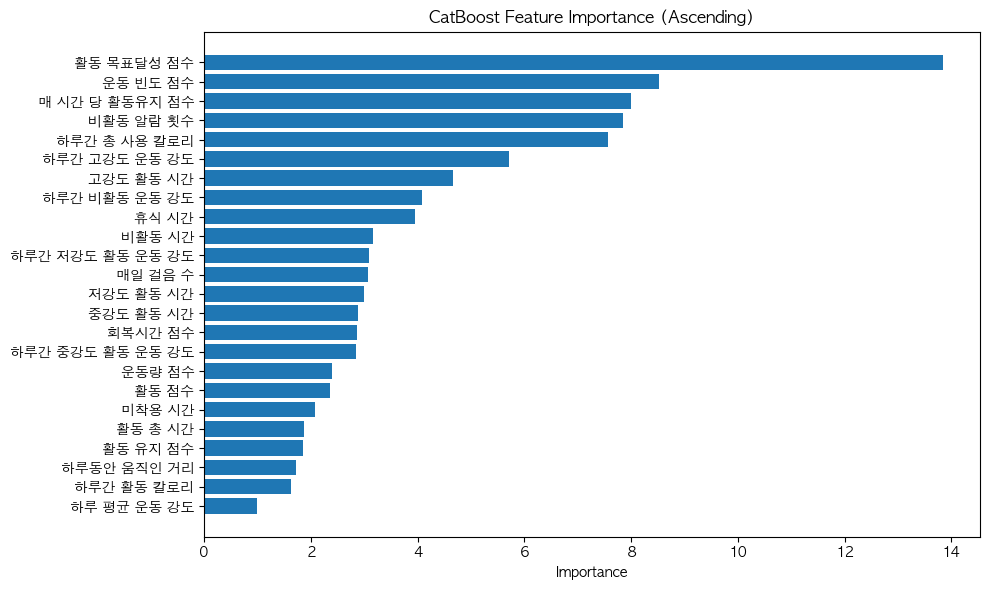

In [94]:
import matplotlib.pyplot as plt
import numpy as np

# feature importance 추출
feature_importances = model.get_feature_importance()
feature_names = X_train.columns

# numpy array로 변환
feature_importances = np.array(feature_importances)
feature_names = np.array(feature_names)

# 중요도 기준 오름차순 정렬
sorted_idx = np.argsort(feature_importances)
sorted_importances = feature_importances[sorted_idx]
sorted_names = feature_names[sorted_idx]

# 시각화
plt.figure(figsize=(10, 6))
plt.barh(sorted_names, sorted_importances)
plt.xlabel("Importance")
plt.title("CatBoost Feature Importance (Ascending)")
plt.tight_layout()
plt.show()


In [98]:
# 예: 중요도 기준 상위 10개 피처만 사용
top_k = 5
importances = model.get_feature_importance()
top_indices = importances.argsort()[-top_k:][::-1]
top_features = X_train.columns[top_indices]

# 데이터 선택
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

# 모델 재학습
model_top = CatBoostClassifier(verbose=0, random_state=42)
model_top.fit(X_train_top, Y_train)
y_pred = model_top.predict(X_test_top)

accuracy = accuracy_score(Y_test, y_pred)
print(f"CatBoost Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred))


CatBoost Test Accuracy: 0.5613
              precision    recall  f1-score   support

           0       0.76      0.65      0.70      1956
           1       0.15      0.22      0.18       522

    accuracy                           0.56      2478
   macro avg       0.45      0.44      0.44      2478
weighted avg       0.63      0.56      0.59      2478



In [100]:
import optuna
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import recall_score

def objective(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 100, 1000),
        'depth': trial.suggest_int('depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-3, 10.0, log=True),
        'border_count': trial.suggest_int('border_count', 32, 255),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 1.0),
        'random_strength': trial.suggest_float('random_strength', 1e-3, 10.0),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1.0, 10.0),  # ⚠️ 불균형 대응
        'verbose': 0,
        'random_state': 42,
    }

    model = CatBoostClassifier(**params)

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    recalls = []

    for train_idx, val_idx in cv.split(X_train_top, Y_train):
        X_tr, X_val = X_train_top.iloc[train_idx], X_train_top.iloc[val_idx]
        y_tr, y_val = Y_train.iloc[train_idx], Y_train.iloc[val_idx]

        model.fit(X_tr, y_tr)
        y_pred = model.predict(X_val)

        recalls = []

    for train_idx, val_idx in cv.split(X_train_top, Y_train):
        X_tr, X_val = X_train_top.iloc[train_idx], X_train_top.iloc[val_idx]
        y_tr, y_val = Y_train.iloc[train_idx], Y_train.iloc[val_idx]

        model.fit(X_tr, y_tr)
        y_pred = model.predict(X_val)

        rec = recall_score(y_val, y_pred, pos_label=1)
        recalls.append(rec)

    return np.mean(recalls)

# 튜닝 실행
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)


[I 2025-06-19 23:02:53,252] A new study created in memory with name: no-name-746261c0-16cb-4086-a96e-e0b56c8d519d
[I 2025-06-19 23:03:12,432] Trial 0 finished with value: 0.9413606959892096 and parameters: {'iterations': 418, 'depth': 10, 'learning_rate': 0.11082405413523588, 'l2_leaf_reg': 1.4026016497252645, 'border_count': 58, 'bagging_temperature': 0.6380466878582645, 'random_strength': 1.469192563295863, 'scale_pos_weight': 6.103094784778019}. Best is trial 0 with value: 0.9413606959892096.
[I 2025-06-19 23:03:24,584] Trial 1 finished with value: 0.9112615253025812 and parameters: {'iterations': 350, 'depth': 7, 'learning_rate': 0.2675675339581227, 'l2_leaf_reg': 0.14572753256836424, 'border_count': 175, 'bagging_temperature': 0.39240221519501084, 'random_strength': 7.757108464681635, 'scale_pos_weight': 5.126308905549797}. Best is trial 0 with value: 0.9413606959892096.
[I 2025-06-19 23:03:45,041] Trial 2 finished with value: 0.8600601723225261 and parameters: {'iterations': 522,

In [101]:
# 최적 파라미터 추출
best_params = study.best_params
best_params['verbose'] = 0
best_params['random_state'] = 42

# 모델 재학습
model_top = CatBoostClassifier(**best_params)
model_top.fit(X_train_top, Y_train)

# 테스트셋 평가
y_pred = model_top.predict(X_test_top)

print(f"\n📊 CatBoost (Top 5 features + Optuna 튜닝)")
print("Accuracy:", accuracy_score(Y_test, y_pred))
print(classification_report(Y_test, y_pred, digits=4))



📊 CatBoost (Top 5 features + Optuna 튜닝)
Accuracy: 0.2106537530266344
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000      1956
           1     0.2107    1.0000    0.3480       522

    accuracy                         0.2107      2478
   macro avg     0.1053    0.5000    0.1740      2478
weighted avg     0.0444    0.2107    0.0733      2478



/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

# 타켓 별로 학습

In [29]:
from category_encoders import TargetEncoder

encoder = TargetEncoder()
train_act['이메일_enc'] = encoder.fit_transform(train_act['이메일'], train_act['진단'])
test_act['이메일_enc'] = encoder.transform(test_act['이메일'])

X_train = train_act.drop(columns=['진단', '이메일', '활동 시작 시간', '활동 종료 시간'])
Y_train = train_act['진단']
X_test = test_act.drop(columns=['진단', '이메일', '활동 시작 시간', '활동 종료 시간'])
Y_test = test_act['진단']


In [30]:
print(len(train_act[train_act['진단'] == 0]))
print(len(train_act[train_act['진단'] == 1]))

print(len(test_act[test_act['진단'] == 0]))
print(len(test_act[test_act['진단'] == 1]))

5781
3924
1956
522


In [31]:
from imblearn.over_sampling import SMOTE

print("전:", X_train.shape, Y_train.value_counts().to_dict())

smote = SMOTE(random_state=42)
X_train, Y_train = smote.fit_resample(X_train, Y_train)

print("후:", X_train.shape, pd.Series(Y_train).value_counts().to_dict())


전: (9705, 25) {0: 5781, 1: 3924}
후: (11562, 25) {1: 5781, 0: 5781}


## RANDOM FOREST

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

model = RandomForestClassifier(random_state=42, class_weight='balanced')
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)


accuracy = accuracy_score(Y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

print(classification_report(Y_test, y_pred))

Test Accuracy: 0.7893
              precision    recall  f1-score   support

           0       0.79      1.00      0.88      1956
           1       0.00      0.00      0.00       522

    accuracy                           0.79      2478
   macro avg       0.39      0.50      0.44      2478
weighted avg       0.62      0.79      0.70      2478



/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

## CATBOOST

In [39]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report

model = CatBoostClassifier(scale_pos_weight=3, verbose = 0, eval_metric='Logloss', random_state=42)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(Y_test, y_pred)
print(f"CatBoost Test Accuracy: {accuracy:.4f}")
print(classification_report(Y_test, y_pred))

CatBoost Test Accuracy: 0.7893
              precision    recall  f1-score   support

           0       0.79      1.00      0.88      1956
           1       0.00      0.00      0.00       522

    accuracy                           0.79      2478
   macro avg       0.39      0.50      0.44      2478
weighted avg       0.62      0.79      0.70      2478



/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leehyunsong/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu